In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from bs4 import BeautifulSoup as bs
import re
import requests
%config InlineBackend.figure_formats = ['svg']
%matplotlib inline

sns.set(context='notebook', style='whitegrid', font_scale=1.2)

In [2]:
df_epl = pd.read_csv('df_all_cp.csv')

In [3]:
df_epl.head()

,Unnamed: 0,Player,Nation,Pos_x,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Foot,Market Value,Year
0,0,Patrick van Aanholt,NED,DF,Crystal Palace,28,29,29,2507,27.9,3,2,176.0,left,7700000.0,2019.0
1,1,Max Aarons,ENG,DF,Norwich City,19,36,36,3240,36.0,0,1,171.0,right,22000000.0,2019.0
2,2,Tammy Abraham,ENG,FW,Chelsea,21,34,25,2215,24.6,15,3,190.0,right,41800000.0,2019.0
3,3,Adrián,ESP,GK,Liverpool,32,11,9,875,9.7,0,0,190.0,right,1100000.0,2019.0
4,4,Sergio Agüero,ARG,FW,Manchester City,31,24,18,1452,16.1,16,3,173.0,right,19800000.0,2019.0


In [4]:
df_epl.columns

Index(['Unnamed: 0', 'Player', 'Nation', 'Pos_x', 'Squad', 'Age', 'MP',
       'Starts', 'Min', '90s', 'Gls', 'Ast', 'Height', 'Foot', 'Market Value',
       'Year'],
      dtype='object')

In [5]:
df_epl.drop('Unnamed: 0', axis=1, inplace=True)

In [6]:
df_epl_cp = df_epl.copy()

In [7]:
df_epl_cp.head()

,Player,Nation,Pos_x,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Foot,Market Value,Year
0,Patrick van Aanholt,NED,DF,Crystal Palace,28,29,29,2507,27.9,3,2,176.0,left,7700000.0,2019.0
1,Max Aarons,ENG,DF,Norwich City,19,36,36,3240,36.0,0,1,171.0,right,22000000.0,2019.0
2,Tammy Abraham,ENG,FW,Chelsea,21,34,25,2215,24.6,15,3,190.0,right,41800000.0,2019.0
3,Adrián,ESP,GK,Liverpool,32,11,9,875,9.7,0,0,190.0,right,1100000.0,2019.0
4,Sergio Agüero,ARG,FW,Manchester City,31,24,18,1452,16.1,16,3,173.0,right,19800000.0,2019.0


In [8]:
# there ws about 10 data as '-' which I changed it to 'Right' which is the mode
df_epl_cp[df_epl_cp['Foot'] == "-"] 

,Player,Nation,Pos_x,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Foot,Market Value,Year
538,Theo Corbeanu,CAN,FW,Wolves,18,1,0,9,0.1,0,0,190.0,-,550000.0,2020.0
652,Daniel Jebbison,ENG,FW,Sheffield Utd,17,4,3,284,3.2,1,0,190.0,-,1100000.0,2020.0
674,Reda Khadra,GER,FW,Brighton,19,1,0,5,0.1,0,0,175.0,-,165000.0,2020.0
694,Khanya Leshabela,RSA,MF,Leicester City,20,1,0,10,0.1,0,0,175.0,-,110000.0,2020.0
770,Iliman Ndiaye,FRA,MF,Sheffield Utd,21,1,0,12,0.1,0,0,180.0,-,220000.0,2020.0
821,Lewis Richardson,ENG,MF,Burnley,17,2,0,4,0.0,0,0,NaN,-,220000.0,2020.0
848,Robert Sánchez,ESP,GK,Brighton,22,27,27,2430,27.0,0,0,NaN,-,8800000.0,2020.0
856,Femi Seriki,ENG,DF,Sheffield Utd,18,1,0,1,0.0,0,0,NaN,-,220000.0,2020.0
885,Sidnei Tavares,POR,MF,Leicester City,18,2,1,85,0.9,0,0,NaN,-,330000.0,2020.0
888,Allan Tchaptchet,FRA,DF,Southampton,18,1,0,13,0.1,0,0,NaN,-,165000.0,2020.0


In [9]:
def change_foot(x):
    if x =='-':
        x = 'right'
    return x

In [10]:
df_epl_cp['Foot'] = df_epl_cp.Foot.apply(change_foot)

In [11]:
df_epl_cp.head()

,Player,Nation,Pos_x,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Foot,Market Value,Year
0,Patrick van Aanholt,NED,DF,Crystal Palace,28,29,29,2507,27.9,3,2,176.0,left,7700000.0,2019.0
1,Max Aarons,ENG,DF,Norwich City,19,36,36,3240,36.0,0,1,171.0,right,22000000.0,2019.0
2,Tammy Abraham,ENG,FW,Chelsea,21,34,25,2215,24.6,15,3,190.0,right,41800000.0,2019.0
3,Adrián,ESP,GK,Liverpool,32,11,9,875,9.7,0,0,190.0,right,1100000.0,2019.0
4,Sergio Agüero,ARG,FW,Manchester City,31,24,18,1452,16.1,16,3,173.0,right,19800000.0,2019.0


In [12]:
# now changing the null values in height

In [13]:
# Replacing the 
df_epl_cp['Height'].mean()

182.24392819429778

In [14]:
df_epl_cp['Height'].fillna((df_epl_cp['Height'].mean()), inplace=True)

In [15]:
sns.pairplot(df_epl_cp)
#fig = sns_pairplot.get_figure()
#plt.savefig("output_paiplot.png")

In [16]:
df_clean_epl = df_epl_cp.copy()

In [17]:
df_clean_epl.shape

(953, 15)

In [18]:
df_clean_epl.columns

Index(['Player', 'Nation', 'Pos_x', 'Squad', 'Age', 'MP', 'Starts', 'Min',
       '90s', 'Gls', 'Ast', 'Height', 'Foot', 'Market Value', 'Year'],
      dtype='object')

In [19]:
df_clean_epl.sample(5)

,Player,Nation,Pos_x,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Foot,Market Value,Year
492,Christian Benteke,BEL,FW,Crystal Palace,29,30,21,1816,20.2,10,1,190.0,right,9900000.0,2020.0
310,Davy Pröpper,NED,MF,Brighton,27,35,32,2829,31.4,1,2,185.0,right,8800000.0,2019.0
837,Mathew Ryan,AUS,GK,Brighton,28,11,11,990,11.0,0,0,184.0,right,6600000.0,2020.0
652,Daniel Jebbison,ENG,FW,Sheffield Utd,17,4,3,284,3.2,1,0,190.0,right,1100000.0,2020.0
474,Gareth Bale,WAL,FW,Tottenham,31,20,10,920,10.2,11,2,185.0,left,19800000.0,2020.0


In [20]:
df_clean_epl.corr()

,Age,MP,Starts,Min,90s,Gls,Ast,Height,Market Value,Year
Age,1.000000,0.107699,0.145080,0.143680,0.143640,0.034848,0.007499,0.139426,-0.236888,0.017805
MP,0.107699,1.000000,0.933097,0.942096,0.942097,0.416539,0.476474,0.012498,0.414987,-0.127141
Starts,0.145080,0.933097,1.000000,0.996965,0.996961,0.370085,0.430143,0.105049,0.405290,-0.094655
Min,0.143680,0.942096,0.996965,1.000000,0.999997,0.363533,0.428044,0.106830,0.406585,-0.095193
90s,0.143640,0.942097,0.996961,0.999997,1.000000,0.363602,0.428022,0.106822,0.406616,-0.095293
Gls,0.034848,0.416539,0.370085,0.363533,0.363602,1.000000,0.554082,-0.093416,0.506987,-0.050165
Ast,0.007499,0.476474,0.430143,0.428044,0.428022,0.554082,1.000000,-0.239170,0.542772,-0.058948
Height,0.139426,0.012498,0.105049,0.106830,0.106822,-0.093416,-0.239170,1.000000,-0.057323,0.010332
Market Value,-0.236888,0.414987,0.405290,0.406585,0.406616,0.506987,0.542772,-0.057323,1.000000,-0.007193
Year,0.017805,-0.127141,-0.094655,-0.095193,-0.095293,-0.050165,-0.058948,0.010332,-0.007193,1.000000


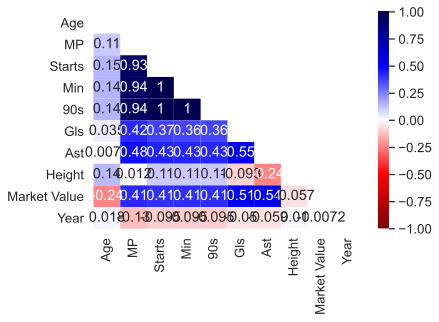

In [21]:
import numpy as np
upper = np.triu(df_clean_epl.corr())  # optionally, you can just look at the lower triangle
sns.heatmap(df_clean_epl.corr(), cmap="seismic_r", annot=True, vmin=-1, vmax=1, mask=upper);
sns.set(rc={'figure.figsize':(12,12)})

In [22]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [23]:
def vif(df_X):
    '''
    Calculate the VIF for each feature of df_X (a Pandas DataFrame).
    '''
    vif_data = [variance_inflation_factor(df_X.values, i)
                for i in range(df_X.shape[1])]
    
    return pd.Series(vif_data, index=df_X.columns)

In [24]:
#We only analyze the VIF for predictors
vif(df_clean_epl[['Age','Min','Gls','Ast']])

Age    3.147494
Min    3.994036
Gls    1.962175
Ast    2.227845
dtype: float64

In [25]:
# Now wuth VIF we realize that how much multicollinirarity exists in between the features and we have to remove 
# those features... here it would be ... for sure min and 90 .. maybe starts... 
#['Age','MP','Starts','Min','90s','Gls','Ast']

## Creating a baseline Linear Regression Model

In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [27]:
X = df_clean_epl[['Age','Min','Gls','Ast']]
y = df_clean_epl[['Market Value']]

In [28]:
lr = LinearRegression()
lr.fit(X,y)
lr.score(X,y)

0.45607158846112106

In [29]:
print(lr.coef_)

[[-1358027.00267407     4262.89193992  1529789.741589    2856250.47134929]]


In [30]:
import statsmodels.api as sm
#Create the model
model = sm.OLS(y, sm.add_constant(X)) 

#Fit
fit = model.fit()

#Print out summary
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Market Value   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.454
Method:                 Least Squares   F-statistic:                     198.7
Date:                Wed, 29 Sep 2021   Prob (F-statistic):          9.63e-124
Time:                        21:09:06   Log-Likelihood:                -17090.
No. Observations:                 953   AIC:                         3.419e+04
Df Residuals:                     948   BIC:                         3.421e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.903e+07   3.02e+06     12.944      0.000    3.31e+07    4.49e+07
Age        -1.358e+06   1.18e+05    -11.552      0.000   -1.59e+06   -1.13e+06
Min         4262.8919    527.635      8.079      0.000    3227.425    5298.359
Gls          1.53e+06   1.65e+05      9.248      0.000    1.21e+06    1.85e+06
Ast         2.856e+06   2.86e+05      9.995      0.000     2.3e+06    3.42e+06
==============================================================================
Omnibus:                      216.913   Durbin-Watson:                   1.907
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              612.430
Skew:                           1.143   Prob(JB):                    1.03e-133
Kurtosis:                       6.193   Cond. No.                     1.14e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.14e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Diagonistic Plotting

In [31]:
import scipy.stats as stats

In [32]:

def diagnostic_plots(y_pred, y_true, resid):
    fig, axes = plt.subplots(1, 3, figsize=(10, 4))

    g1 = sns.regplot(x=y_pred, y=y_true, ci=False, fit_reg=False, line_kws={'color': 'blue'}, ax=axes[0], scatter_kws={'s': 5})
    g1.set_xlabel('Predicted Target')
    g1.set_ylabel('True Target')
    g1.plot(y_true, y_true, '--', color='gray')

    g2 = sns.regplot(x=y_pred, y=resid, lowess=True, ax=axes[1], line_kws={'color': 'red'}, scatter_kws={'s': 5})
    g2.set_xlabel('Predicted Target')
    g2.set_ylabel('Residual')
    g2.axhline(y=0, color='gray', linestyle='--')

    stats.probplot(resid, dist="norm", plot=axes[2])

    fig.suptitle('Diagnostic Plots');
    fig.tight_layout();

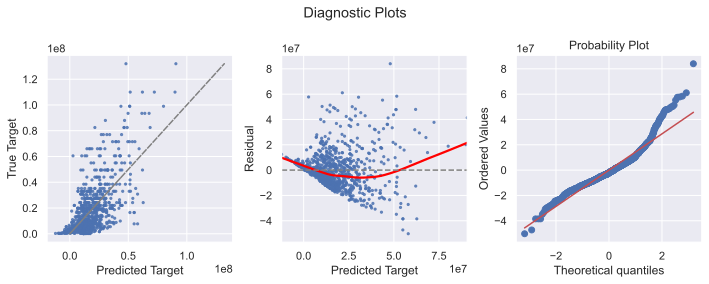

In [33]:
diagnostic_plots(fit.fittedvalues, y, fit.resid)

## Preparing Dummies

In [34]:
#Getting Dummies for 'Foot' , 'Pos' and 'Nation' and 'Squad'

In [35]:
#foot   
pd.get_dummies(df_clean_epl['Foot'], drop_first=False).head(5)

,both,left,right
0,0,1,0
1,0,0,1
2,0,0,1
3,0,0,1
4,0,0,1


In [36]:
df_clean_epl = pd.get_dummies(df_clean_epl, columns=['Foot'], drop_first=False) 

In [37]:
df_clean_epl.head(1)

,Player,Nation,Pos_x,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Market Value,Year,Foot_both,Foot_left,Foot_right
0,Patrick van Aanholt,NED,DF,Crystal Palace,28,29,29,2507,27.9,3,2,176.0,7700000.0,2019.0,0,1,0


In [38]:
pd.get_dummies(df_clean_epl['Pos_x'], drop_first=False).head(5)

,DF,FW,GK,MF
0,1,0,0,0
1,1,0,0,0
2,0,1,0,0
3,0,0,1,0
4,0,1,0,0


In [39]:
df_clean_epl = pd.get_dummies(df_clean_epl, columns=['Pos_x'], drop_first=False) #can just apply it to the whole df

In [40]:
df_clean_epl.head()

,Player,Nation,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Market Value,Year,Foot_both,Foot_left,Foot_right,Pos_x_DF,Pos_x_FW,Pos_x_GK,Pos_x_MF
0,Patrick van Aanholt,NED,Crystal Palace,28,29,29,2507,27.9,3,2,176.0,7700000.0,2019.0,0,1,0,1,0,0,0
1,Max Aarons,ENG,Norwich City,19,36,36,3240,36.0,0,1,171.0,22000000.0,2019.0,0,0,1,1,0,0,0
2,Tammy Abraham,ENG,Chelsea,21,34,25,2215,24.6,15,3,190.0,41800000.0,2019.0,0,0,1,0,1,0,0
3,Adrián,ESP,Liverpool,32,11,9,875,9.7,0,0,190.0,1100000.0,2019.0,0,0,1,0,0,1,0
4,Sergio Agüero,ARG,Manchester City,31,24,18,1452,16.1,16,3,173.0,19800000.0,2019.0,0,0,1,0,1,0,0


### Nation Dummies -
##### We'll devide this two 3 catagories ( British , Europian , World )

In [41]:
df_clean_epl_dum = df_clean_epl.copy()

In [42]:
df_clean_epl_dum.head()

,Player,Nation,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Market Value,Year,Foot_both,Foot_left,Foot_right,Pos_x_DF,Pos_x_FW,Pos_x_GK,Pos_x_MF
0,Patrick van Aanholt,NED,Crystal Palace,28,29,29,2507,27.9,3,2,176.0,7700000.0,2019.0,0,1,0,1,0,0,0
1,Max Aarons,ENG,Norwich City,19,36,36,3240,36.0,0,1,171.0,22000000.0,2019.0,0,0,1,1,0,0,0
2,Tammy Abraham,ENG,Chelsea,21,34,25,2215,24.6,15,3,190.0,41800000.0,2019.0,0,0,1,0,1,0,0
3,Adrián,ESP,Liverpool,32,11,9,875,9.7,0,0,190.0,1100000.0,2019.0,0,0,1,0,0,1,0
4,Sergio Agüero,ARG,Manchester City,31,24,18,1452,16.1,16,3,173.0,19800000.0,2019.0,0,0,1,0,1,0,0


In [43]:
df_clean_epl_dum['Nation'].value_counts()

ENG    382
FRA     50
ESP     45
POR     40
SCO     39
BRA     39
IRL     36
NED     28
WAL     25
BEL     24
ARG     20
GER     20
CIV     15
NGA     12
NIR     12
SUI     10
DEN      9
COL      9
JAM      8
SEN      8
NOR      8
GHA      8
ITA      8
AUS      8
USA      8
SWE      7
JPN      6
EGY      5
TUR      5
POL      5
UKR      4
MLI      4
MAR      4
PAR      4
ALG      4
GAB      4
AUT      3
COD      3
MEX      2
NZL      2
IRN      2
GUI      2
RSA      2
ZIM      2
MKD      1
ISL      1
SVK      1
MTN      1
TUN      1
CUB      1
SKN      1
FIN      1
CAN      1
BFA      1
URU      1
ROU      1
Name: Nation, dtype: int64

In [44]:
British = ['ENG','IRL', 'SCO','WAL']
EU = ['SVK','RSA','UKR','TUR','POR','SWE','POL','NOR','AUT','ITA','DEN','SUI','GER','BEL','NED','ESP','FRA','FIN']
World = ['CAN','BFA','TUN','ROU','URU','MTN','SKN','CUB','MKD','ISL','ZIM','IRN','MEX','NZL','GUI','COD','MAR','PAR','MLI','GAB','ALG','EGY','JPN','SEN','JAM','USA','AUS','GHA','COL','NGA','NIR','CIV','ARG','BRA']

        

In [45]:
def nation_change(row):
    if row['Nation'] in British:
        row['Nation'] = 'BRTSH'
    elif row['Nation'] in EU:
        row['Nation'] = 'EU'
    elif row['Nation'] in World:
        row['Nation'] = 'WORLD'
    else:
        print(row['Nation'],type(row['Nation']))
    return row


In [46]:
df_clean_epl_dum = df_clean_epl_dum.apply(nation_change,axis = 1)

In [47]:
df_clean_epl_dum.head()

,Player,Nation,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Market Value,Year,Foot_both,Foot_left,Foot_right,Pos_x_DF,Pos_x_FW,Pos_x_GK,Pos_x_MF
0,Patrick van Aanholt,EU,Crystal Palace,28,29,29,2507,27.9,3,2,176.0,7700000.0,2019.0,0,1,0,1,0,0,0
1,Max Aarons,BRTSH,Norwich City,19,36,36,3240,36.0,0,1,171.0,22000000.0,2019.0,0,0,1,1,0,0,0
2,Tammy Abraham,BRTSH,Chelsea,21,34,25,2215,24.6,15,3,190.0,41800000.0,2019.0,0,0,1,0,1,0,0
3,Adrián,EU,Liverpool,32,11,9,875,9.7,0,0,190.0,1100000.0,2019.0,0,0,1,0,0,1,0
4,Sergio Agüero,WORLD,Manchester City,31,24,18,1452,16.1,16,3,173.0,19800000.0,2019.0,0,0,1,0,1,0,0


### We'll devide the 'Squad Teams' into 2 catagories ( Top 6 , Other )

In [48]:
df_clean_epl_dum['Squad'].value_counts()

Chelsea            52
Sheffield Utd      51
Arsenal            51
Manchester Utd     50
Everton            50
Brighton           50
Liverpool          49
Newcastle Utd      48
Leicester City     47
Southampton        46
Crystal Palace     45
West Ham           45
Wolves             43
Tottenham          42
Manchester City    41
Aston Villa        40
Burnley            39
Bournemouth        32
West Brom          29
Norwich City       28
Watford            27
Fulham             26
Leeds United       22
Name: Squad, dtype: int64

In [49]:
top_6_teams = ['Arsenal','Chelsea','Manchester Utd','Liverpool','Tottenham','Manchester City']

In [50]:
def team_change(row):
    if row['Squad'] in top_6_teams:
        row['Squad'] = 'TOP_6'
    else:
        row['Squad'] = 'OTHER'
    return row

In [51]:
df_clean_epl_dum = df_clean_epl_dum.apply(team_change,axis = 1)

In [52]:
df_clean_epl_dum.head()

,Player,Nation,Squad,Age,MP,Starts,Min,90s,Gls,Ast,Height,Market Value,Year,Foot_both,Foot_left,Foot_right,Pos_x_DF,Pos_x_FW,Pos_x_GK,Pos_x_MF
0,Patrick van Aanholt,EU,OTHER,28,29,29,2507,27.9,3,2,176.0,7700000.0,2019.0,0,1,0,1,0,0,0
1,Max Aarons,BRTSH,OTHER,19,36,36,3240,36.0,0,1,171.0,22000000.0,2019.0,0,0,1,1,0,0,0
2,Tammy Abraham,BRTSH,TOP_6,21,34,25,2215,24.6,15,3,190.0,41800000.0,2019.0,0,0,1,0,1,0,0
3,Adrián,EU,TOP_6,32,11,9,875,9.7,0,0,190.0,1100000.0,2019.0,0,0,1,0,0,1,0
4,Sergio Agüero,WORLD,TOP_6,31,24,18,1452,16.1,16,3,173.0,19800000.0,2019.0,0,0,1,0,1,0,0


In [55]:
df_clean_epl_dum= pd.get_dummies(df_clean_epl_dum, columns=['Squad'], drop_first=False)

In [57]:
df_clean_epl_dum= pd.get_dummies(df_clean_epl_dum, columns=['Nation'], drop_first=False)

In [58]:
df_clean_epl_dum.head()

,Player,Age,MP,Starts,Min,90s,Gls,Ast,Height,Market Value,...,Foot_right,Pos_x_DF,Pos_x_FW,Pos_x_GK,Pos_x_MF,Squad_OTHER,Squad_TOP_6,Nation_BRTSH,Nation_EU,Nation_WORLD
0,Patrick van Aanholt,28,29,29,2507,27.9,3,2,176.0,7700000.0,...,0,1,0,0,0,1,0,0,1,0
1,Max Aarons,19,36,36,3240,36.0,0,1,171.0,22000000.0,...,1,1,0,0,0,1,0,1,0,0
2,Tammy Abraham,21,34,25,2215,24.6,15,3,190.0,41800000.0,...,1,0,1,0,0,0,1,1,0,0
3,Adrián,32,11,9,875,9.7,0,0,190.0,1100000.0,...,1,0,0,1,0,0,1,0,1,0
4,Sergio Agüero,31,24,18,1452,16.1,16,3,173.0,19800000.0,...,1,0,1,0,0,0,1,0,0,1


In [59]:
df_clean_epl_dum.to_csv('df_epl_clean_with_dummies.csv')

## Creating a baseline Linear Regression with Dummies

In [71]:
df_clean_epl_dum.columns

Index(['Player', 'Age', 'MP', 'Starts', 'Min', '90s', 'Gls', 'Ast', 'Height',
       'Market Value', 'Year', 'Foot_both', 'Foot_left', 'Foot_right',
       'Pos_x_DF', 'Pos_x_FW', 'Pos_x_GK', 'Pos_x_MF', 'Squad_OTHER',
       'Squad_TOP_6', 'Nation_BRTSH', 'Nation_EU', 'Nation_WORLD'],
      dtype='object')

In [72]:
X_dum = df_clean_epl_dum[['Age','Min','Gls','Ast','Foot_left', 'Foot_right',
       'Pos_x_DF', 'Pos_x_FW', 'Pos_x_GK', 'Pos_x_MF', 'Squad_OTHER',
       'Squad_TOP_6', 'Nation_BRTSH', 'Nation_EU', 'Nation_WORLD']]
y_dum = df_clean_epl_dum[['Market Value']]

In [73]:
lr_dum = LinearRegression()
lr_dum.fit(X_dum,y_dum)
lr_dum.score(X_dum,y_dum)

0.6012972496675573

In [74]:
print(lr_dum.coef_)

[[-1.28515081e+06  5.05182132e+03  1.44496998e+06  2.30826350e+06
  -5.20172719e+06 -4.96843703e+06 -5.90041380e+05 -1.39434366e+06
   9.14389918e+05  1.06999512e+06 -8.06884941e+06  8.06884941e+06
  -2.08895250e+06  1.67046566e+06  4.18486839e+05]]


In [75]:
#Create the model
model_dum = sm.OLS(y_dum, sm.add_constant(X_dum)) 

#Fit
fit_dum = model_dum.fit()

#Print out summary
fit_dum.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Market Value   R-squared:                       0.601
Model:                            OLS   Adj. R-squared:                  0.596
Method:                 Least Squares   F-statistic:                     118.1
Date:                Wed, 29 Sep 2021   Prob (F-statistic):          3.15e-178
Time:                        21:41:36   Log-Likelihood:                -16942.
No. Observations:                 953   AIC:                         3.391e+04
Df Residuals:                     940   BIC:                         3.397e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         2.195e+07   2.05e+06     10.712      0.000    1.79e+07     2.6e+07
Age          -1.285e+06   1.06e+05    -12.168      0.000   -1.49e+06   -1.08e+06
Min           5051.8213    493.040     10.246      0.000    4084.236    6019.407
Gls           1.445e+06   1.63e+05      8.892      0.000    1.13e+06    1.76e+06
Ast           2.308e+06   2.57e+05      8.995      0.000     1.8e+06    2.81e+06
Foot_left    -5.202e+06   2.99e+06     -1.740      0.082   -1.11e+07    6.66e+05
Foot_right   -4.968e+06   2.91e+06     -1.710      0.088   -1.07e+07    7.35e+05
Pos_x_DF      4.897e+06   8.77e+05      5.586      0.000    3.18e+06    6.62e+06
Pos_x_FW      4.093e+06   9.59e+05      4.268      0.000    2.21e+06    5.98e+06
Pos_x_GK      6.402e+06   1.48e+06      4.335      0.000     3.5e+06     9.3e+06
Pos_x_MF      6.557e+06   8.62e+05      7.606      0.000    4.87e+06    8.25e+06
Squad_OTHER   2.906e+06   1.15e+06      2.522      0.012    6.45e+05    5.17e+06
Squad_TOP_6   1.904e+07   1.11e+06     17.213      0.000    1.69e+07    2.12e+07
Nation_BRTSH  5.228e+06    8.2e+05      6.376      0.000    3.62e+06    6.84e+06
Nation_EU     8.987e+06   9.42e+05      9.544      0.000    7.14e+06    1.08e+07
Nation_WORLD  7.735e+06   1.02e+06      7.548      0.000    5.72e+06    9.75e+06
==============================================================================
Omnibus:                      161.796   Durbin-Watson:                   1.812
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              437.024
Skew:                           0.875   Prob(JB):                     1.26e-95
Kurtosis:                       5.818   Cond. No.                     2.19e+19
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.69e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

## SKLearn CROSS-VALIDATION

In [92]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import KFold

In [93]:
# hold out 20% of the data for final testing
XX, X_test, yy, y_test = train_test_split(X_dum, y_dum, test_size=.2, random_state=42)

In [94]:
from sklearn.model_selection import cross_val_score
lm = LinearRegression()


cross_val_score(lm, XX, yy, # estimator, features, target
                cv=5, # number of folds 
                scoring='r2') # scoring metric

array([0.61934869, 0.61583468, 0.5327182 , 0.57353917, 0.57066923])

In [95]:
#similar as above just scarambled
kf = KFold(n_splits=5, shuffle=True, random_state = 42)
cross_val_score(lm, XX, yy, cv=kf, scoring='r2')

array([0.62448825, 0.45304039, 0.55054946, 0.66904662, 0.54149357])

In [ ]:
# test on the test set!!!

## Feature Engineering

In [ ]:
'''
X_dum = df_clean_epl_dum[['Age','Min','Gls','Ast','Foot_left', 'Foot_right',
       'Pos_x_DF', 'Pos_x_FW', 'Pos_x_GK', 'Pos_x_MF', 'Squad_OTHER',
       'Squad_TOP_6', 'Nation_BRTSH', 'Nation_EU', 'Nation_WORLD']]
y_dum = df_clean_epl_dum[['Market Value']]

'''

In [100]:
df_final_1 = df_clean_epl_dum.copy()

In [101]:

#Separate our features from our target

X1 = df_final_1.loc[:,['Age','Min','Gls','Ast','Foot_left', 'Foot_right',
       'Pos_x_DF', 'Pos_x_FW', 'Pos_x_GK', 'Pos_x_MF', 'Squad_OTHER',
       'Squad_TOP_6', 'Nation_BRTSH', 'Nation_EU', 'Nation_WORLD']]

y1 = df_final_1['Market Value']

In [103]:
X1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 953 entries, 0 to 952
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Age           953 non-null    int64
 1   Min           953 non-null    int64
 2   Gls           953 non-null    int64
 3   Ast           953 non-null    int64
 4   Foot_left     953 non-null    int64
 5   Foot_right    953 non-null    int64
 6   Pos_x_DF      953 non-null    int64
 7   Pos_x_FW      953 non-null    int64
 8   Pos_x_GK      953 non-null    int64
 9   Pos_x_MF      953 non-null    int64
 10  Squad_OTHER   953 non-null    uint8
 11  Squad_TOP_6   953 non-null    uint8
 12  Nation_BRTSH  953 non-null    uint8
 13  Nation_EU     953 non-null    uint8
 14  Nation_WORLD  953 non-null    uint8
dtypes: int64(10), uint8(5)
memory usage: 79.2 KB


In [104]:
def split_and_validate(X, y):
    '''
    For a set of features and target X, y, perform a 80/20 train/val split, 
    fit and validate a linear regression model, and report results
    '''
    
    # perform train/val split
    X_train, X_val, y_train, y_val = \
        train_test_split(X, y, test_size=0.2, random_state=42)
    
    # fit linear regression to training data
    lr_model = LinearRegression()
    lr_model.fit(X_train, y_train)
    
    # score fit model on validation data
    val_score = lr_model.score(X_val, y_val)
    
    # report results
    print('\nValidation R^2 score was:', val_score)
    print('Feature coefficient results: \n')
    for feature, coef in zip(X.columns, lr_model.coef_):
        print(feature, ':', f'{coef:.2f}')

In [105]:
split_and_validate(X1, y1)


Validation R^2 score was: 0.5568438846659922
Feature coefficient results: 

Age : -1256182.41
Min : 5182.61
Gls : 1266017.48
Ast : 2510274.28
Foot_left : -5674546.52
Foot_right : -4457514.12
Pos_x_DF : -623112.11
Pos_x_FW : -1437598.66
Pos_x_GK : 854582.79
Pos_x_MF : 1206127.98
Squad_OTHER : -7924982.40
Squad_TOP_6 : 7924982.40
Nation_BRTSH : -2455048.51
Nation_EU : 1602873.02
Nation_WORLD : 852175.49


In [141]:
X2 = X1.copy()

X2['Age^2'] =(X2['Age'])**2
X2['Min^2'] = (X2['Min'])**2
X2['3^Gls'] = 3**(X2['Gls'])
X2['Ast^2'] = (X2['Ast'])**2


split_and_validate(X2, y1)


Validation R^2 score was: 0.5730542096097961
Feature coefficient results: 

Age : 3081411.82
Min : 4907.88
Gls : 1241315.71
Ast : 697078.61
Foot_left : -6901553.88
Foot_right : -5937722.16
Pos_x_DF : -927793.73
Pos_x_FW : -534851.31
Pos_x_GK : 315593.19
Pos_x_MF : 1147051.85
Squad_OTHER : -7913741.74
Squad_TOP_6 : 7913741.74
Nation_BRTSH : -2028996.42
Nation_EU : 1436802.16
Nation_WORLD : 592194.26
Age^2 : -84299.53
Min^2 : 0.12
3^Gls : -0.00
Ast^2 : 190258.43


In [163]:
X3 = X2.copy()

# multiplicative interaction
X3['Age_x_Min'] = X3['Age'] * X3['Min']
X3['Age_x_Gls'] = X3['Age'] * X3['Gls']
X3['Age_x_Ast'] = X3['Age'] * X3['Ast']

# division interaction
X3['Ast_/_Min'] = X3['Ast'] / X3['Min']
X3['Gls_/_Min'] = X3['Gls'] / X3['Min']


#X3['Gls_/_Pos_x_FW'] = X3['Pos_x_FW'] / X3['Nation_BRTSH']
#X3['Gls_/_Pos_x_MF'] = X3['Gls'] / X3['Pos_x_MF']
#X3['Gls_/_Pos_x_DF'] = X3['Gls'] / X3['Pos_x_DF']
#X3['Gls_/_Pos_x_GK'] = X3['Gls'] / X3['Pos_x_GK']

split_and_validate(X3, y1)


Validation R^2 score was: 0.63764629095212
Feature coefficient results: 

Age : 3354604.95
Min : 20593.29
Gls : 6296079.20
Ast : 3222998.39
Foot_left : -5933060.01
Foot_right : -5022382.17
Pos_x_DF : -454116.20
Pos_x_FW : 489538.81
Pos_x_GK : -1744949.15
Pos_x_MF : 1709526.54
Squad_OTHER : -7985198.50
Squad_TOP_6 : 7985198.50
Nation_BRTSH : -2459066.12
Nation_EU : 1408557.36
Nation_WORLD : 1050508.76
Age^2 : -66589.63
Min^2 : 0.61
3^Gls : 0.00
Ast^2 : 233543.08
Age_x_Min : -669.17
Age_x_Gls : -187881.86
Age_x_Ast : -135257.61
Ast_/_Min : 618987641.22
Gls_/_Min : -437922726.32


In [143]:
def add_deviation_feature(X, feature, category):
    
    # temp groupby object
    category_gb = X.groupby(category)[feature]
    
    # create columns of category means and standard deviations
    category_mean = category_gb.transform(lambda x: x.mean())
    category_std = category_gb.transform(lambda x: x.std())
    
    # compute stds from category mean for each feature value,
    # add to X as new feature
    deviation_feature = (X[feature] - category_mean) / category_std 
    X[feature + '_Dev_' + category] = deviation_feature

In [151]:
'''X4 = X3.copy()

#add_deviation_feature(X4, 'Pos_x_MF', 'Nation_BRTSH')
#add_deviation_feature(X4, 'Nation_BRTSH', 'Squad_TOP_6')
#add_deviation_feature(X4, 'Pos_x_MF', 'Nation_EU')


split_and_validate(pd.get_dummies(X4), y1)'''

"X4 = X3.copy()\n\n#add_deviation_feature(X4, 'Pos_x_MF', 'Nation_BRTSH')\n#add_deviation_feature(X4, 'Nation_BRTSH', 'Squad_TOP_6')\n#add_deviation_feature(X4, 'Pos_x_MF', 'Nation_EU')\n\n\nsplit_and_validate(pd.get_dummies(X4), y1)"

NameError: name 'df_final_1' is not defined

In [ ]:
x_train, x_test , y_train , y_test = train_test_split(x,y,train_size=0.8,test_size=.2,random_state=42)

In [ ]:
x_train, x_val , y_train , y_val = train_test_split(x_train,y_train,train_size=0.75,test_size=.25,random_state=42)

In [ ]:
mlr = LinearRegression()

In [ ]:
mlr.fit(x_train,y_train)

In [ ]:
# Use Seaborn to fit a line to our data
#sns.lmplot(x='MP', y='Market Value', data=df_epl, ci=False, truncate=False)

In [ ]:
mlr.score(x_train,y_train)

In [ ]:
print(mlr.coef_)

In [ ]:
results_summary = fit.summary()
results_as_html = results_summary.tables[1].as_html()
pd.read_html(results_as_html, header=0, index_col=0)[0]

In [ ]:
y_predict = mlr.predict(x_test)

In [ ]:
plt.scatter(y_test,y_predict,alpha=.5)

In [ ]:
residuals = y_predict - y_test

In [ ]:
plt.scatter(y_predict,residuals, alpha=0.5)